In [11]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


C:\Users\dajul\anaconda3\lib\site-packages\IPython\core\magics\pylab.py:159: UserWarning: pylab import has clobbered these variables: ['time']
`%matplotlib` prevents importing * from pylab and numpy
  warn("pylab import has clobbered these variables: %s"  % clobbered +


In [4]:
!pip install git+https://github.com/jakevdp/JSAnimation.git

  Cloning https://github.com/jakevdp/JSAnimation.git to c:\users\dajul\appdata\local\temp\pip-req-build-bc8ulmme


  Running command git clone -q https://github.com/jakevdp/JSAnimation.git 'C:\Users\dajul\AppData\Local\Temp\pip-req-build-bc8ulmme'
  fatal: unable to access 'https://github.com/jakevdp/JSAnimation.git/': Could not resolve host: github.com
ERROR: Command errored out with exit status 128: git clone -q https://github.com/jakevdp/JSAnimation.git 'C:\Users\dajul\AppData\Local\Temp\pip-req-build-bc8ulmme' Check the logs for full command output.


# Simulating free fall

The state vector has the position and velocity vectors
$$
\mathbf{x}= \begin{bmatrix}
 \mathbf{p}
\\ 
\mathbf{\dot p}
\end{bmatrix}.
$$

The dynamics is described by the differential equation
$$
\mathbf{\dot x} = \begin{bmatrix}
\mathbf{\dot p}\\
-g\mathbf{e}_3
\end{bmatrix},
$$
where $\mathbf{e}_3= [0,0,1]^\top$.

### Euler integration

In [14]:
def simulate(Δt, x, u):
    x += Δt * u
    return x

### Simulation parameters

In [15]:
# mass and gravity
m, g = 1, 9.8

# z unit vector
e3 = np.array([0,0,1])

tf = 3.     # Final time in the simulation
Δt = 0.1    # Time step

# Time vector
time = linspace(0.,tf, int(tf / Δt) + 1)  # Time intervaltf = 3.

# Simulation 
<span style="color:red; font-weight:bold">TODO: Include a) gravity acceleration (based on the newton equation)</span>

In [19]:
# Initial conditions
x = array([0, 0, 10, 0., 0., 0.])  # State [x, y, z, dx, dy, dz]
dx = np.zeros(6)   # Derivate of the state. Zero velocity and zero acceleration in the beginning

x_log = [copy(x)]  # To record to states at every time step


# Simulate
for t in time[1:]:    
    # Dynamics
    dx[:3] = x[3:]    # Velocity
    dx[3:] = -g * e3  # Acceleration
    
    x = simulate(Δt, x, dx)
    x_log.append(copy(x))
    
x_log = array(x_log)

### Plot: time Vs z-coordinate

Text(0, 0.5, 'Altitude (z-axis)')

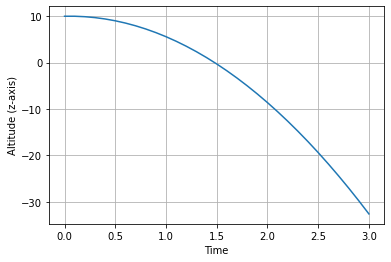

In [20]:
grid()
plot(time, x_log[:,2])
plt.xlabel('Time')
plt.ylabel('Altitude (z-axis)')

In [21]:
import matplotlib.pyplot as plt
from matplotlib import animation
from JSAnimation import IPython_display    
from IPython.display import HTML
    


fig, ax = plt.subplots()


def animate(t):
    ax.clear()
    
    # Path
    ax.plot(x_log[:,0], x_log[:,2], 'r--')
    
    # Initial conditions
    ax.plot(x_log[t,0], x_log[t,2], 'bo')
        
plt.close(fig)
anim = animation.FuncAnimation(fig, animate, frames=len(time), interval=60)
HTML(anim.to_jshtml())



# Simulating the floor (like dropping an egg)
The velocity and acceleration of the particle stops when the z-coordinate reaches zero.

Note: that the low time step makes the robot pass the zero. A small time step will reduce that error.

<span style="color:red; font-weight:bold">TODO: Include the stop condition to simulate the floor</span>

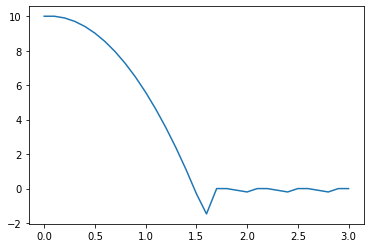

In [30]:
# Initial conditions
x = array([0, 0, 10, 0., 0., 0.])
dx = np.zeros(6)

x_log = [copy(x)]

# Run
for t in time[1:]:
        
    # Dynamics
    dx[:3] = x[3:]
    
    if x[2] >= 0:
        dx[3:] = -g*e3
    else:        
        dx[3:] = np.zeros(3)
        x[2] = 0
        x[5] = 0
    
    x = simulate(Δt, x, dx)
    x_log.append(copy(x))
    
x_log = array(x_log)

plot(time, x_log[:,2])

In [31]:
fig, ax = plt.subplots()
anim = animation.FuncAnimation(fig, animate, frames=len(time), interval=60)
plt.close(fig)
HTML(anim.to_jshtml())

# Challenge 1: Simulating a flat ramp
The ramp has the form $z(x)=-2x+3$ and the point starts at $(x,z)=(-3,9)$.

The ramp ends at $x=1$, then the robot will continue describing a parabolic trajectory.

In [16]:
# Initial conditions
x = array([-3, 0, 9, 0., 0., 0.])
dx = np.zeros(6)

x_log = [copy(x)]

# Run
for t in time[1:]:    

    # Forces
    xt = x[0]
    tang = np.array([1., 0, -2])/sqrt(5)            
#     ax = np.dot(tang, -g*e3) * tang[0]
#     ay = 0
#     az = 2*(vx**2 + xt * ax)
#     acc = [ax, ay, az]
    
    if xt < -2:                        
        acc = np.dot(tang, -g*e3) * tang
    else:
        acc =  -g*e3
    #print(acc)    
    #acc = f_T / m
    
    # Dynamics
    dx[:3] = x[3:]
    dx[3:] = acc
    
    
    x = simulate(Δt, x, dx)
    x_log.append(copy(x))
    
x_log = array(x_log)

#plot(time, x_log[:,0])
# Path
# plot(x_log[:,0], x_log[:,2], 'r--')
#plot(t1,-2*t1+3)

fig, ax = plt.subplots()
anim = animation.FuncAnimation(fig, animate, frames=len(time), interval=20)
plt.close(fig)
HTML(anim.to_jshtml())

# Challenge 2: Simulating a curved ramp
The ramp has the form $z(x)=x^2$ and the point starts at $(x,z)=(-3,9)$.

The ramp ends at $x=1$, then the robot will continue describing a parabolic trajectory.

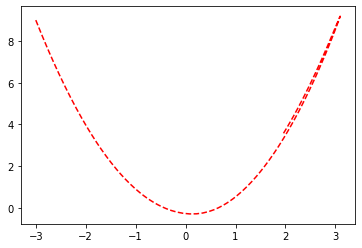

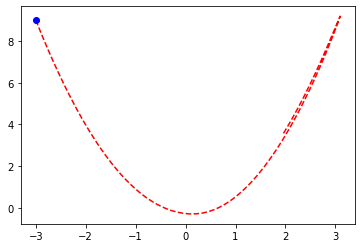

In [13]:
tf = 4
Δt = 0.01    # Time step
time = linspace(0.,tf, int(tf / Δt) + 1)  # Time interval

# Initial conditions
x = array([-3, 0, 9, 0., 0., 0.])
dx = np.zeros(6)

x_log = [copy(x)]

# Run
for t in time[1:]:
    #print(t, x[0])
    
    # Dynamics
    dx[:3] = x[3:]
        
    # acceleration
    px = x[0]    
    vx = x[3]    
                    
    if px < 4:                
        ax = -(2*px*(2*(vx**2)+g)) / (1 + 4*(px**2))
        ay = 0
        az = 2*(vx**2 + px * ax)
        acc = [ax, ay, az]
        #print(px, acc, x)
    else:
        acc =  -g*e3
                
        
    dx[:3] = x[3:]
    dx[3:] = acc
        
    
    x = simulate(Δt, x, dx)
    x_log.append(copy(x))
    
x_log = array(x_log)

# Path
plot(x_log[:,0], x_log[:,2], 'r--')

t1 = np.linspace(-3, 1)

fig, ax = plt.subplots()
anim = animation.FuncAnimation(fig, animate, frames=len(time), interval=20)
plt.close(fig)
HTML(anim.to_jshtml())

